# Image Augmentation

In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
import matplotlib.image as mpimg

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.preprocessing import image as image_utils

In [2]:
image_dir = '/home/sz.lee/blue_bsc4892/adrian.l/Jaws_labeled_images/'

# Move ~20% data image for validation dataset, only run once

In [66]:
# import os
# import shutil
# import random

# # Define the source directory containing all classes
# source_dir = image_dir

# # Define the destination directory to move the subset of images
# destination_dir = "./Jaws_valiation_images"

# # Define the percentage of images to move (20%)
# percentage_to_move = 0.2

# # List all subdirectories (classes) in the source directory
# classes = [d for d in os.listdir(source_dir) if os.path.isdir(os.path.join(source_dir, d))]

# # Iterate over each class
# for class_name in classes:
#     class_dir = os.path.join(source_dir, class_name, class_name)
#     # Skip classes with fewer than 2 images
#     if len(os.listdir(class_dir)) < 2:
#         print(f"Skipping class '{class_name}' with fewer than 2 images.")
#         continue
    
#     # Create a directory in the destination directory for the class
#     os.makedirs(os.path.join(destination_dir, class_name), exist_ok=True)
    
#     # List all images in the class directory
#     images = os.listdir(class_dir)
    
#     # Calculate the number of images to move
#     num_to_move = int(len(images) * percentage_to_move)
    
#     # Randomly select num_to_move images to move
#     images_to_move = random.sample(images, num_to_move)
    
#     # Move the selected images to the destination directory
#     for image in images_to_move:
#         src_path = os.path.join(class_dir, image)
#         dest_path = os.path.join(destination_dir, class_name, image)
#         shutil.move(src_path, dest_path)
#         print(f"Moved '{image}' from '{class_name}' to '{destination_dir}/{class_name}'")


Skipping class 'Carcharhinus_brachyurus' with fewer than 2 images.
Moved 'IMG_0224_Large.png' from 'Carcharhinus_limbatus' to './Jaws_valiation_images/Carcharhinus_limbatus'
Skipping class 'Isurus_oxyrhinchus' with fewer than 2 images.
Moved 'IMG_0290_Large.png' from 'Carcharhinus_leucas' to './Jaws_valiation_images/Carcharhinus_leucas'
Moved 'IMG_0197_Large.png' from 'Carcharhinus_leucas' to './Jaws_valiation_images/Carcharhinus_leucas'
Moved 'IMG_0277_Large.png' from 'Carcharhinus' to './Jaws_valiation_images/Carcharhinus'
Moved 'IMG_0285_Large.png' from 'Carcharodon_carcharias' to './Jaws_valiation_images/Carcharodon_carcharias'
Moved 'IMG_0286_Large.png' from 'Carcharodon_carcharias' to './Jaws_valiation_images/Carcharodon_carcharias'
Skipping class 'Isistius_brasiliensis' with fewer than 2 images.
Skipping class 'Negaprion_acutidens' with fewer than 2 images.
Moved 'IMG_0208_Large.png' from 'Carcharhinidae' to './Jaws_valiation_images/Carcharhinidae'
Moved 'IMG_0292_Large.png' fro

# Begin loading

In [3]:
# Input image dimensions, etc.
resized_height = 224
resized_width = 224
num_channel = 3 
num_classes = 18
batch_size = 32

In [5]:
def custom_preprocessing_function(image):
    # Randomly select a channel to scale
    channel_to_scale = np.random.randint(0, 3)  # 0 for Red, 1 for Green, 2 for Blue

    # Generate a random scaling factor between 0.5 and 1.5
    scaling_factor = np.random.uniform(0.5, 1.5)

    # Scale the selected channel
    image[:,:,channel_to_scale] *= scaling_factor

    # Clip the values to ensure they remain in the valid range [0, 255]
    image = np.clip(image, 0, 255)

    return image


In [6]:
datagen = ImageDataGenerator(
    rotation_range=180,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],  # Randomly adjust brightness between 0.5x and 1.5x
    channel_shift_range=0.5,
    fill_mode='nearest',
    preprocessing_function=custom_preprocessing_function
)

In [4]:
class_names = ['Carcharhinidae', 'Carcharhinus', 'Carcharhinus_brachyurus', 'Carcharhinus_leucas', 'Carcharhinus_limbatus', 'Carcharhinus_perezi', 
               'Carcharias_taurus', 'Carcharodon_carcharias', 'Galeocerdo_cuvier', 'Ginglymostoma_cirratum', 'Isistius_brasiliensis', 'Isurus_oxyrhinchus', 
               'Nebrius_ferrugineus', 'Negaprion_acutidens', 'Orectolobus', 'Orectolobus_ornatus', 'Squatina', 'Triaenodon_obesus']

augmented_directory = './Jaws_augmented_images/'

# Setup directories. Only run once

for sp in class_names:
    if not os.path.exists(os.path.join(augmented_directory, sp)):
        os.mkdir(os.path.join(augmented_directory, sp))
    else:
        print(f"Directory '{os.path.join(augmented_directory, sp)}' already exists.")

FileNotFoundError: [Errno 2] No such file or directory: './Jaws_augmented_images/Carcharhinidae'

In [21]:
# Working script but don't rerun unless the directory is cleared
# augmented_directory = './Jaws_augmented_images/'

# for sp in range(len(class_names)):
#     img_iter = datagen.flow_from_directory(
#         os.path.join(image_dir, class_names[sp]),
#         target_size=(224, 224),  # Resize images to 224x224
#         batch_size=batch_size,  # Use batch size of 1 to process one image at a time
#         class_mode='categorical',  # No class labels are needed
#         shuffle=False,  # Preserve the order of images
#         save_to_dir=os.path.join(augmented_directory, class_names[sp]),
#         save_prefix=class_names[sp],
#         save_format='png')
#     len(img_iter.filenames)

#     i = 0
#     for batch in img_iter:    
#         i += 1
#         if i > max(30, 3 * len(img_iter.filenames)):
#             break

Found 32 images belonging to 1 classes.
Found 7 images belonging to 1 classes.
Found 1 images belonging to 1 classes.
Found 11 images belonging to 1 classes.
Found 7 images belonging to 1 classes.
Found 2 images belonging to 1 classes.
Found 1 images belonging to 1 classes.
Found 8 images belonging to 1 classes.
Found 2 images belonging to 1 classes.
Found 3 images belonging to 1 classes.
Found 1 images belonging to 1 classes.
Found 1 images belonging to 1 classes.
Found 2 images belonging to 1 classes.
Found 1 images belonging to 1 classes.
Found 2 images belonging to 1 classes.
Found 1 images belonging to 1 classes.
Found 1 images belonging to 1 classes.
Found 2 images belonging to 1 classes.


In [5]:
validation_directory = './Jaws_valiation_images'

# Setup directories. Only run once

for sp in class_names:
    if not os.path.exists(os.path.join(validation_directory, sp)):
        os.mkdir(os.path.join(validation_directory, sp))
    else:
        print(f"Directory '{os.path.join(validation_directory, sp)}' already exists.")

Directory './Jaws_valiation_images/Carcharhinidae' already exists.
Directory './Jaws_valiation_images/Carcharhinus' already exists.
Directory './Jaws_valiation_images/Carcharhinus_leucas' already exists.
Directory './Jaws_valiation_images/Carcharhinus_limbatus' already exists.
Directory './Jaws_valiation_images/Carcharhinus_perezi' already exists.
Directory './Jaws_valiation_images/Carcharias_taurus' already exists.
Directory './Jaws_valiation_images/Carcharodon_carcharias' already exists.
Directory './Jaws_valiation_images/Galeocerdo_cuvier' already exists.
Directory './Jaws_valiation_images/Ginglymostoma_cirratum' already exists.
Directory './Jaws_valiation_images/Nebrius_ferrugineus' already exists.
Directory './Jaws_valiation_images/Orectolobus' already exists.
Directory './Jaws_valiation_images/Orectolobus_ornatus' already exists.
Directory './Jaws_valiation_images/Squatina' already exists.
Directory './Jaws_valiation_images/Triaenodon_obesus' already exists.


# Below are test scripts

In [10]:
# import os
# # check file before generating
# original_directory = os.path.join(image_dir, class_names[8])

# directory_iterator = datagen.flow_from_directory(
#     original_directory,
#     target_size=(224, 224),  # Resize images to 224x224
#     batch_size=1,  # Use batch size of 1 to process one image at a time
#     class_mode='categorical',  # No class labels are needed
#     shuffle=False)  # Preserve the order of images

# # Print the list of filenames
# print("Filenames:")
# print(directory_iterator.filenames)

Found 2 images belonging to 1 classes.
Filenames:
['Galeocerdo_cuvier/IMG_0238_Large.png', 'Galeocerdo_cuvier/IMG_0245_Large.png']


In [11]:
# img_iter_test = datagen.flow_from_directory(
#     original_directory,
#     target_size=(224, 224),  # Resize images to 224x224
#     batch_size=batch_size,  # Use batch size of 1 to process one image at a time
#     class_mode='categorical',  # No class labels are needed
#     shuffle=False,  # Preserve the order of images
# )
# len(img_iter_test.filenames)

Found 2 images belonging to 1 classes.


2

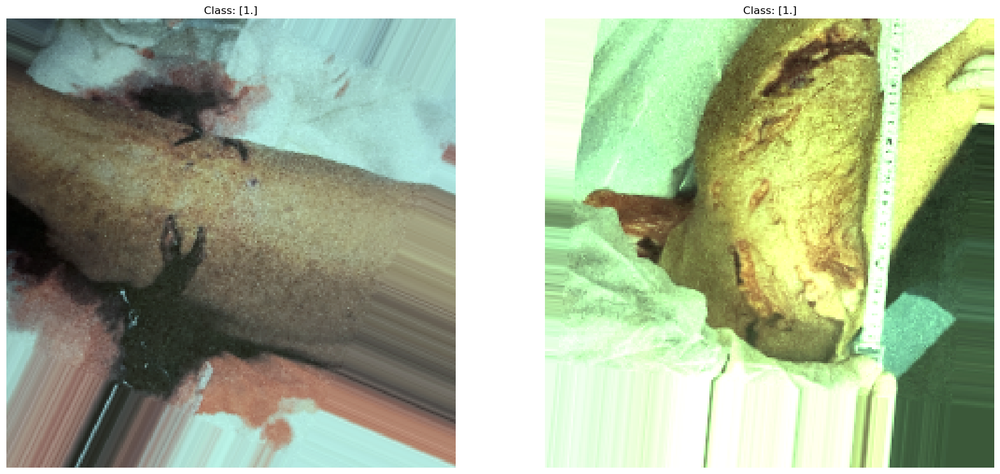

In [14]:
# # Get the batch of images
# batch = next(img_iter_test)

# # Extract images and labels from the batch
# images, labels = batch

# # Plot the first 10 images
# plt.figure(figsize=(20, 10))
# for i in range(2):
#     plt.subplot(1, 2, i + 1)
#     plt.imshow(images[i].astype('uint8'))
#     plt.title(f"Class: {labels[i]}")
#     plt.axis('off')
# plt.show()

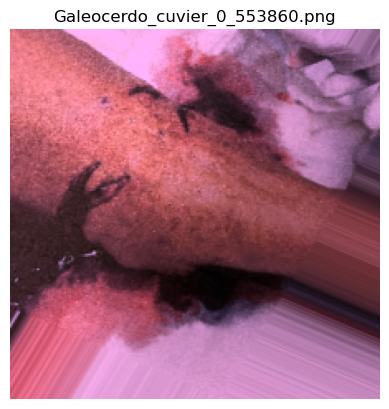

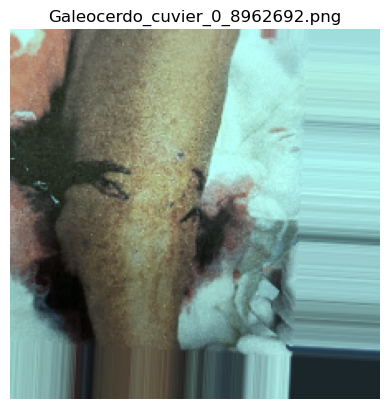

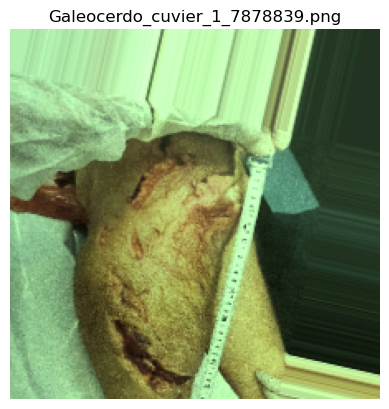

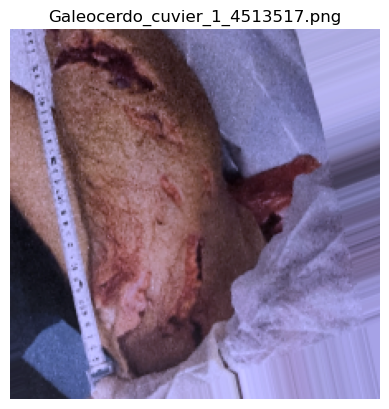

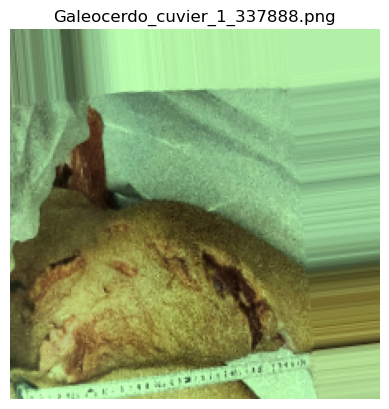

...

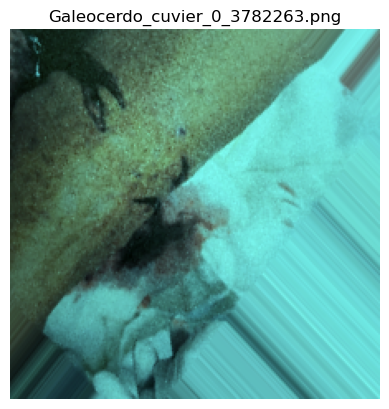

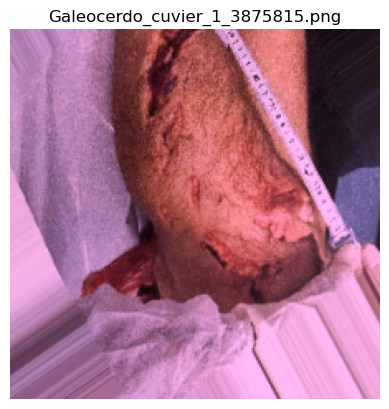

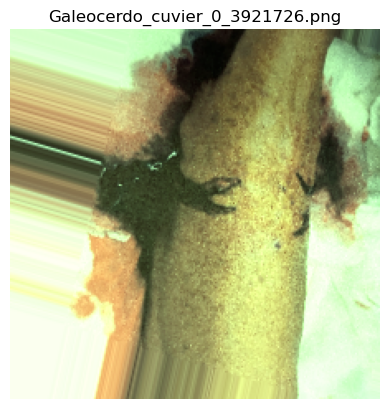

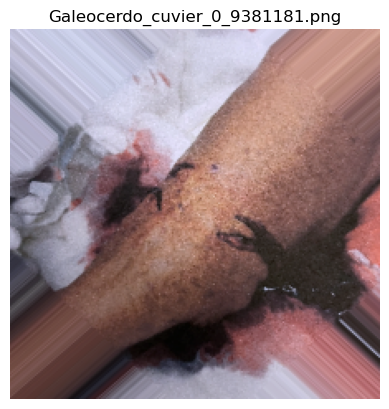

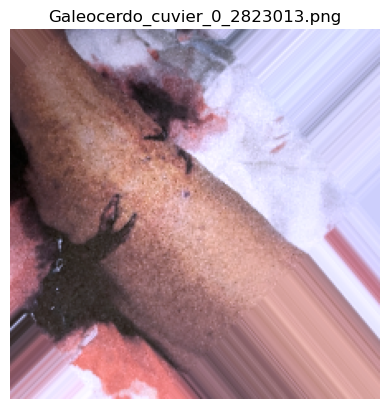

In [22]:
image_files = os.listdir(os.path.join(augmented_directory, class_names[8]))
for filename in image_files:
    # Construct the full path to the image
    filepath = os.path.join(os.path.join(augmented_directory, class_names[8]), filename)
    
    # Open the image using PIL
    img = Image.open(filepath)
    
    # Plot the image using Matplotlib
    plt.imshow(img)
    plt.title(filename)  # Set the title to the filename
    plt.axis('off')  # Turn off axis labels
    plt.show(10)

In [ ]:
augmented_directory